# RANDOM FOREST

# 1. Librairies

In [1]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.tree import plot_tree

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# 2. Importation du data frame

Nous commençons par la lecture du dataset :

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/Axelvel/DS50/main/Datasets/Datasets_Region_France_2016_2020.csv')

Ensuite, nous sélectionnons une région en particulier.
Pour sélectionner la France entière, il suffit de mettre cette ligne en commentaire.    

In [3]:
# Auvergne Rhone-Alpes - Bourgogne Franche-Comte - Bretagne - Centre Val de Loire - Grand Est - Hauts-de-France 
# Ile-de-France - Normandie - Nouvelle-Aquitaine - Occitanie - PACA - Pays de la Loire

df = df[df['Regions'] == 'PACA']

On supprime les lignes avec des valeurs Nan ou égale à 0 qui sont dû à une incohérence des consommations.
Normalement, l'ensemble des données étant nettoyées, cette n'est pas nécessaire.
Cependant, elle permet d'avoir une sécurité suplémentaire s'il reste un ou plusieurs oublis.

In [4]:
df.replace(0,np.nan, inplace=True)
df.dropna(inplace=True)

Le data set sélectionné est donc :

In [5]:
display (df)

,Regions,Dates,Heures,Electricite,Gaz,Tmin,Tmax,Tmoy,Taux de Co2
876960,PACA,01/01/2016,00:00,5858,2226,5.30,12.77,9.03,31
876961,PACA,01/01/2016,00:30,5477,2227,5.30,12.77,9.03,31
876962,PACA,01/01/2016,01:00,5278,2205,5.30,12.77,9.03,32
876963,PACA,01/01/2016,01:30,5262,2212,5.30,12.77,9.03,32
876964,PACA,01/01/2016,02:00,5154,2209,5.30,12.77,9.03,32
...,...,...,...,...,...,...,...,...,...
964651,PACA,31/12/2020,21:30,6109,5712,-1.05,6.80,2.88,35
964652,PACA,31/12/2020,22:00,6024,5583,-1.05,6.80,2.88,35
964653,PACA,31/12/2020,22:30,6079,5573,-1.05,6.80,2.88,35
964654,PACA,31/12/2020,23:00,6212,5731,-1.05,6.80,2.88,35



Informations relatives à notre base de données :

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 87696 entries, 876960 to 964655
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Regions      87696 non-null  object 
 1   Dates        87696 non-null  object 
 2   Heures       87696 non-null  object 
 3   Electricite  87696 non-null  int64  
 4   Gaz          87696 non-null  int64  
 5   Tmin         87696 non-null  float64
 6   Tmax         87696 non-null  float64
 7   Tmoy         87696 non-null  float64
 8   Taux de Co2  87696 non-null  int64  
dtypes: float64(3), int64(3), object(3)
memory usage: 6.7+ MB


# 3. Encoder les données

In [7]:
data_region = df.Regions
data_date = df.Dates
data_heure = df.Heures
data_electricite = df.Electricite
data_gaz = df.Gaz
data_Tmin = df.Tmin
data_Tmoy = df.Tmoy
data_Tmax = df.Tmax
data_CO2 = df['Taux de Co2']

# Encoder des varibles non numériques : Régions, Dates et Heures
from sklearn import preprocessing
labelEncoder = preprocessing.LabelEncoder()

encoded_region = labelEncoder.fit_transform(data_region)
encoded_date = labelEncoder.fit_transform(data_date)
encoded_heure = labelEncoder.fit_transform(data_heure)

## A. Encoder par catégorie l'électricité



Etant donné que nous faisons de la classification et non de la régression, nous allons devoir créer des catégories pour les consommations d'électricité.

Afin de décider ensemble d'une échelle, il est nécessaire de déterminer qu'elles sont des bornes qui composes notre dataset.

In [8]:
# Valeur maximum de la consommation d'électricité sur la plage sélectionnée
max_elec = max(data_electricite)
print('Max électricité : ', max_elec)

# Valeur minimum de la consommation d'électricité sur la plage sélectionnée
min_elec = min(data_electricite)
print('Min électricité : ', min_elec)

# Plage de donnée de la consommation d'électricité sur la plage sélectionnée
ecart = max_elec - min_elec
print('Plage de donnée : ', ecart)

Max électricité :  8331
Min électricité :  667
Plage de donnée :  7664


Nous pouvons avoir plus largement des informations à l'aide de la fonction describe :

In [9]:
df.describe()

,Electricite,Gaz,Tmin,Tmax,Tmoy,Taux de Co2
count,87696.000000,87696.000000,87696.000000,87696.000000,87696.000000,87696.000000
mean,4611.676827,4029.819137,10.266552,20.419398,15.342879,42.223887
std,906.755988,2462.328518,6.133004,7.323586,6.607579,21.990178
min,667.000000,234.000000,-4.150000,2.230000,-0.960000,7.000000
25%,3942.000000,2198.000000,5.180000,14.250000,9.750000,25.000000
50%,4487.000000,3610.000000,9.880000,19.800000,14.730000,38.000000
75%,5214.000000,5956.000000,15.730000,26.600000,21.050000,56.000000
max,8331.000000,9700.000000,23.450000,37.820000,30.320000,125.000000


Ensuite, nous avons créé une échelle en fonction de l'ensemble de ces données. Les données de la consommation d'électricité ressemble à ça :

In [10]:
print(data_electricite)

876960    5858
876961    5477
876962    5278
876963    5262
876964    5154
          ... 
964651    6109
964652    6024
964653    6079
964654    6212
964655    6643
Name: Electricite, Length: 87696, dtype: int64


Nous créons notre échelle :

In [11]:
bins = np.arange(0, 14000, 1000)
bins = np.append(bins, float("inf"))
labels = np.arange(1, 15, 1)
data_electricite = pd.cut(df['Electricite'], bins=bins, labels=labels)
print(bins)
print(labels)

[    0.  1000.  2000.  3000.  4000.  5000.  6000.  7000.  8000.  9000.
 10000. 11000. 12000. 13000.    inf]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14]


Et la colonne en question prend la forme suivante :

In [12]:
print(data_electricite)

876960    6
876961    6
876962    6
876963    6
876964    6
         ..
964651    7
964652    7
964653    7
964654    7
964655    7
Name: Electricite, Length: 87696, dtype: category
Categories (14, int64): [1 < 2 < 3 < 4 ... 11 < 12 < 13 < 14]


## B. Encoder par catégorie le gaz

Nous refaisons la même chose pour le gaz qui doit être aussi classifié.

In [13]:
max_gaz = max(data_gaz)
print('Max gaz : ', max_gaz)

min_gaz = min(data_gaz)
print('Min gaz : ', min_gaz)

ecart = max_gaz - min_gaz
print('Plage de donnée gaz : ', ecart)

Max gaz :  9700
Min gaz :  234
Plage de donnée gaz :  9466


In [14]:
print(data_gaz)

876960    2226
876961    2227
876962    2205
876963    2212
876964    2209
          ... 
964651    5712
964652    5583
964653    5573
964654    5731
964655    5690
Name: Gaz, Length: 87696, dtype: int64


In [15]:
bins = np.arange(0, 10000, 1000)
bins = np.append(bins, float("inf"))
labels = np.arange(1, 11, 1)
data_gaz = pd.cut(df['Gaz'], bins=bins, labels=labels)

print(bins)
print(labels)

[   0. 1000. 2000. 3000. 4000. 5000. 6000. 7000. 8000. 9000.   inf]
[ 1  2  3  4  5  6  7  8  9 10]


In [16]:
print(data_gaz)

876960    3
876961    3
876962    3
876963    3
876964    3
         ..
964651    6
964652    6
964653    6
964654    6
964655    6
Name: Gaz, Length: 87696, dtype: category
Categories (10, int64): [1 < 2 < 3 < 4 ... 7 < 8 < 9 < 10]


# 4. Construction du modèle et calcul des variables comparatives

Nous allons calculer l'accuracy sur le training set et le test set.
Aussi, nous allons calculer le temps que met le modèle pour fit nos données.
Nous l'avons fait pour quatre cas particulier afin de déterminer s'il y a une réelle différence dans ces quatre cas.

Cas A : calculs pour l'électrcité en prenant en paramètre le gaz

Cas B : calculs pour l'électrcité en ne prenant pas en paramètre le gaz

Cas C : calculs pour le gaz en prenant en paramètre l'électricité

Cas D : calculs pour le gaz en ne prenant pas en paramètre l'électricité

## A. Electricté avec gaz en training

Dans un premier temps, nous allons calculer pour l'électrcité en prenant en compte le gaz.

In [17]:
features = [list(i) for i in zip (encoded_region, encoded_date, encoded_heure, data_gaz, data_Tmin, data_Tmoy, data_Tmax, 
                                  data_CO2)]

Nous avons split notre data set en 20% de test et 80% de training. 

In [18]:
X_train, X_test, y_train, y_test = train_test_split(features, data_electricite, test_size=0.2, random_state=4)

Ensuite, nous avons utilisé le modèle RandomForestClassifier et entrainé nos données. Le temps de training est rapporté si dessous en miliseconde (ms) si une région est sélectionnée et en seconde (s) pour la France entière.

Le paramètre "verbose" peut être utile pour voir plus en détail l'exécusion du code et s'assurer que le training est en cours quand il est un peu long. 

In [19]:
forest = RandomForestClassifier(n_estimators=5, random_state=0, verbose=2)
%time forest.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 5
building tree 2 of 5
building tree 3 of 5
building tree 4 of 5
building tree 5 of 5
Wall time: 423 ms


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.2s finished


RandomForestClassifier(n_estimators=5, random_state=0, verbose=2)

Si nous faisons une prédiction sur l'ensemble de test, nous obtenons une moyenne d'erreur très faible :

In [20]:
predictions = forest.predict(X_test)

# Calcul de la valeur absolue de l'erreur
errors = abs(predictions - y_test.astype(np.int8))

print('Moyenne des erreurs :', round(np.mean(errors), 2), 'degrés')

Moyenne des erreurs : 0.11 degrés


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


Enfin, nous calulons l'accuracy sur le training set et le test set.
Les résultats sont satisfaisants.

In [21]:
print("Accuracy on training set: {:.3f}".format(forest.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(forest.score(X_test, y_test)))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Accuracy on training set: 0.987
Accuracy on test set: 0.894


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


Nous allons faire la même chose pour les trois autres cas.

## B. Electricté sans gaz en training

In [22]:
features = [list(i) for i in zip (encoded_region, encoded_date, encoded_heure, data_Tmin, data_Tmoy, data_Tmax, data_CO2)]

X_train, X_test, y_train, y_test = train_test_split(features, data_electricite, test_size=0.2, random_state=4)

forest = RandomForestClassifier(n_estimators=5, random_state=0) #, verbose=2
%time forest.fit(X_train, y_train)

predictions = forest.predict(X_test)
errors = abs(predictions - y_test.astype(np.int8))
print('Moyenne des erreurs :', round(np.mean(errors), 2), 'degrés')

print("Accuracy on training set: {:.3f}".format(forest.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(forest.score(X_test, y_test)))


Wall time: 461 ms
Moyenne des erreurs : 0.11 degrés
Accuracy on training set: 0.987
Accuracy on test set: 0.892


## C. Gaz avec électricité en training

In [23]:
features = [list(i) for i in zip (encoded_region, encoded_date, encoded_heure, data_electricite, data_Tmin, data_Tmoy, 
                                  data_Tmax, data_CO2)]

X_train, X_test, y_train, y_test = train_test_split(features, data_gaz,test_size=0.2, random_state=4)

forest = RandomForestClassifier(n_estimators=5, random_state=0) #, verbose=2
%time forest.fit(X_train, y_train)

predictions = forest.predict(X_test)
errors = abs(predictions - y_test.astype(np.int8))
print('Moyenne des erreurs :', round(np.mean(errors), 2), 'degrés')

print("Accuracy on training set: {:.3f}".format(forest.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(forest.score(X_test, y_test)))

Wall time: 434 ms
Moyenne des erreurs : 0.14 degrés
Accuracy on training set: 0.985
Accuracy on test set: 0.874


## D. Gaz sans électricité en training

In [24]:
features = [list(i) for i in zip (encoded_region, encoded_date, encoded_heure, data_Tmin, data_Tmoy, data_Tmax, data_CO2)]

X_train, X_test, y_train, y_test = train_test_split(features, data_gaz, test_size=0.2, random_state=4)

forest = RandomForestClassifier(n_estimators=5, random_state=0) #, verbose=2
%time forest.fit(X_train, y_train)

predictions = forest.predict(X_test)
errors = abs(predictions - y_test.astype(np.int8))
print('Moyenne des erreurs :', round(np.mean(errors), 2), 'degrés')

print("Accuracy on training set: {:.3f}".format(forest.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(forest.score(X_test, y_test)))

Wall time: 434 ms
Moyenne des erreurs : 0.13 degrés
Accuracy on training set: 0.986
Accuracy on test set: 0.882


# 5. Interprétation des résultats

## A. Features Importances

Il peut être fort utile de regarder l'importance des colonnes entre elles. Pour cela, nous allons utiliser "feature_importances_". Les résultats suivants prouvent que malgré la corélation entre les variables de gaz et d'électricité, il est normal que leur utilisation mutuelle dans les calculs précédents ne pertubent presque pas les résultats.

### Electricité

In [25]:
features = [list(i) for i in zip (encoded_region, encoded_date, encoded_heure, data_electricite, data_gaz, data_Tmin, data_Tmoy, data_Tmax, data_CO2)]

X_train, X_test, y_train, y_test = train_test_split(features, data_electricite, test_size=0.2, random_state=4)

forest = RandomForestClassifier(n_estimators=5, random_state=0)
forest.fit(X_train, y_train)

pd.DataFrame(forest.feature_importances_,
              index = df.columns, 
              columns = ["Importance for electricity"]).sort_values("Importance for electricity", ascending = False)

,Importance for electricity
Electricite,0.682583
Tmax,0.105736
Tmoy,0.094660
Heures,0.079570
Gaz,0.017430
Taux de Co2,0.008595
Tmin,0.008351
Dates,0.003073
Regions,0.000000


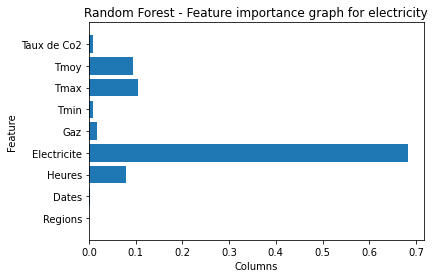

In [26]:
def plot_feature_importance(model):
  n_feature = len(df.columns)
  plt.barh(np.arange(n_feature), model.feature_importances_)
  plt.yticks(np.arange(n_feature), df.columns)
  plt.title('Random Forest - Feature importance graph for electricity')
  plt.xlabel("Columns")
  plt.ylabel("Feature")
  plt.ylim(-1, n_feature)

plot_feature_importance(forest)

Le tableau si dessous montre que la variable la plus importante pour la consommation d'électricité est la température maximale à heuteur de 10%, suivi de très près par la température moyenne (entre 7 et 8%) et alors que seulement de 1 à 2% pour le Gaz.

### Gaz 

In [27]:
features = [list(i) for i in zip (encoded_region, encoded_date, encoded_heure, data_electricite, data_gaz, data_Tmin, data_Tmoy, data_Tmax, data_CO2)]

X_train, X_test, y_train, y_test = train_test_split(features, data_gaz, test_size=0.2, random_state=4)

forest = RandomForestClassifier(n_estimators=5, random_state=0) #, verbose=2
forest.fit(X_train, y_train)

pd.DataFrame(forest.feature_importances_,
              index = df.columns, 
              columns = ["Importance for gaz"]).sort_values("Importance for gaz", ascending = False)

,Importance for gaz
Gaz,0.792579
Taux de Co2,0.085613
Tmax,0.045929
Tmoy,0.023648
Tmin,0.018896
Electricite,0.013811
Dates,0.012120
Heures,0.007404
Regions,0.000000


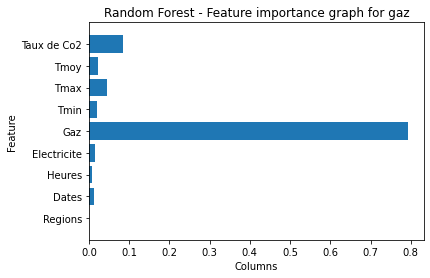

In [28]:
def plot_feature_importance(model):
  n_feature = len(df.columns)
  plt.barh(np.arange(n_feature), model.feature_importances_)
  plt.yticks(np.arange(n_feature), df.columns)
  plt.title('Random Forest - Feature importance graph for gaz')
  plt.xlabel("Columns")
  plt.ylabel("Feature")
  plt.ylim(-1, n_feature)

plot_feature_importance(forest)

De la même manière que pour l'éctricité, le tableau ci-dessus montre que la variable la plus importante pour la consommation de gaz est le taux de C02 à heuteur de 8 à 10% et non l'électricité qui est entre 1 et 2%.

## B. Affichage des arbres

In [29]:
number = len(forest.estimators_)

# This may not the best way to view each estimator as it is small
fn = list(df.columns)
cn = [ "1",  "2",  "3",  "4",  "5",  "6",  "7",  "8",  "9", "10"]
fig, axes = plt.subplots(nrows = 1, ncols = 5,figsize = (100,20), dpi=300)
for index in range(0, number):
    plot_tree(forest.estimators_[index],
                   feature_names = fn, 
                   class_names=cn,
                   filled = True,
                   ax = axes[index]);
    
    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
fig.savefig('forest_5trees.png')